<center>
    <img src='images/logo.png' width='400px'>
    <h1>MÔN HỌC: THỊ GIÁC MÁY TÍNH (7080518)</h1>
<h2> Chương 2: XỬ LÝ VÀ NÂNG CAO CHẤT LƯỢNG ẢNH - Phần 3</h2>
</center>

---

Xử lý ảnh (Image processing): là quá trình tạo ra ảnh mới từ ảnh có sẵn, VD: tăng độ sáng, cắt ảnh, khử nhiễu,… không tập trung vào việc hiểu nội dung của bức ảnh.

**Nội dung bài học - phần 3:**

**II. Cải thiện chất lượng ảnh:**

1. Làm mờ - mịn  ảnh
    * Làm mịn trung bình
    * Làm mịn trung vị
    * Làm mịn Gaussian
2.  Nhiễu và khử nhiễu trong ảnh
3. Giới thiệu Nhân tích chập
4. Nhân tích chập 2D trong OpenCV

---
*Copyright @dangvannam.FIT.HUMG*

In [1]:
#Khai báo sử dụng thư viện:
import numpy as np
import matplotlib.pyplot as plt
import cv2
print('Version OpenCV:', cv2.__version__)

Version OpenCV: 4.9.0


### 1. Làm mờ - mịn ảnh với bộ lọc (Blurring images)
---
* Làm mịn ảnh hay còn gọi là làm mờ là một thao tác xử lý đơn giản và được sử dụng thường xuyên trong xử lý ảnh. Có rất nhiều lý do để làm mịn ảnh, Một trong số lý do đó là để giảm nhiễu.
* Để thực hiện thao tác làm mịn ảnh sử dụng một cửa sổ trượt kích thước k x k (kernel). Kích thước kernel càng lớn thì ảnh càng mịn. Giá trị điểm ảnh ở giữa được tính bằng hàm f của toàn bộ điểm ảnh tại vị trí cửa sổ trượt quét qua.

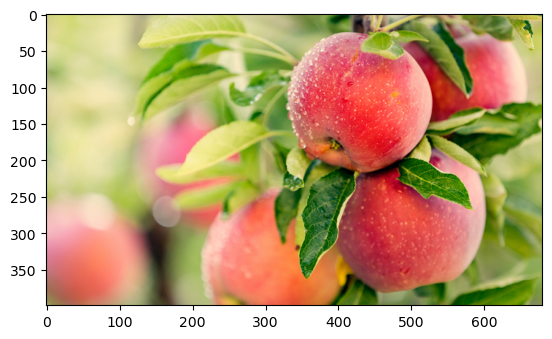

In [2]:
#Đọc ảnh:
img_orignal = cv2.imread('images/apples.jpg',1)

#Chuyển sang hệ màu RGB để hiện thị:
img_orignal = cv2.cvtColor(img_orignal,cv2.COLOR_BGR2RGB)

#Hiển thị ảnh gốc:
plt.imshow(img_orignal,cmap='gray')
plt.show()

In [3]:
#Lấy kích thước ảnh ban đầu:
h = img_orignal.shape[0]
w = img_orignal.shape[1]
print('Độ phân giải ảnh ban đầu:',h,'x',w)

Độ phân giải ảnh ban đầu: 399 x 680


**1. phương thức lọc trung bình cv2.blur():**

Phương thức này sử dụng cách thức đơn giản nhất. Mỗi pixel điểm ảnh đầu là là trung bình cộng của các pixel lân cận.

**cv2.blur(src, kernel)**

Ý nghĩa các tham số:

1. src: ảnh gốc cần thay đổi kích thước.
2. kernel (width, height): Kích thước cửa sổ trượt

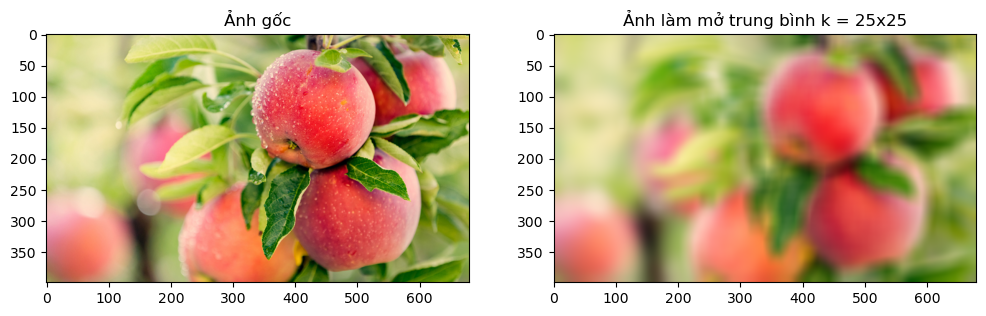

In [6]:
#Thiết lập kernel:
kernel = (25,25)

# Thực hiện làm mịn (làm mờ) trung bình
img_apple_25 = cv2.blur(img_orignal, kernel)

# hiển thị kết quả
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(img_orignal)
plt.title('Ảnh gốc')

plt.subplot(1,2,2)
plt.imshow(img_apple_25)
plt.title('Ảnh làm mở trung bình k = 25x25')

plt.show()

In [7]:
#Giá trị điểm ảnh kênh R của ảnh gốc:
img_orignal[:,:,0]

array([[202, 204, 204, ..., 112, 135,  93],
       [203, 204, 205, ..., 101, 126,  99],
       [202, 204, 206, ..., 123, 148, 120],
       ...,
       [166, 164, 161, ..., 133, 133, 133],
       [171, 168, 166, ..., 135, 134, 134],
       [175, 172, 169, ..., 135, 134, 133]], dtype=uint8)

In [8]:
#Giá trị điểm ảnh kênh R của ảnh sau khi làm mờ:
img_apple_25[:,:,0]

array([[211, 211, 211, ..., 183, 183, 183],
       [211, 211, 211, ..., 183, 183, 183],
       [211, 211, 211, ..., 183, 183, 183],
       ...,
       [153, 153, 153, ..., 128, 128, 128],
       [152, 152, 153, ..., 128, 128, 128],
       [152, 152, 152, ..., 128, 128, 128]], dtype=uint8)

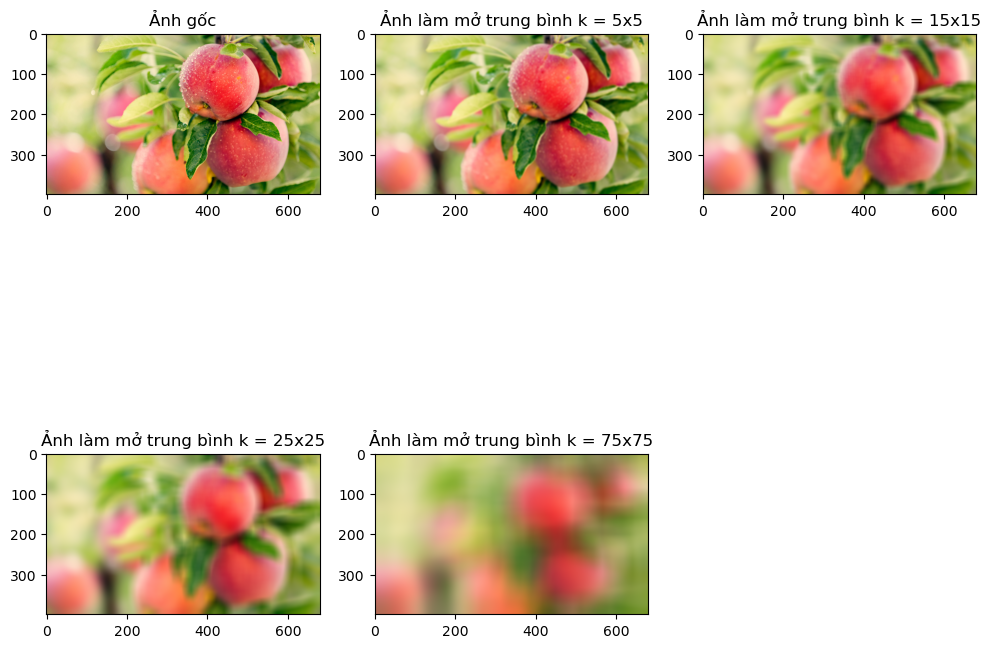

In [13]:
#Làm mịn ảnh với các kernel khác nhau:

img_apple_5 = cv2.blur(img_orignal,(5,5))
img_apple_15 = cv2.blur(img_orignal,(15,15))
img_apple_75 = cv2.blur(img_orignal,(75,75))

# hiển thị kết quả
plt.figure(figsize=(12,10))
plt.subplot(2,3,1)
plt.imshow(img_orignal)
plt.title('Ảnh gốc')

plt.subplot(2,3,2)
plt.imshow(img_apple_5)
plt.title('Ảnh làm mở trung bình k = 5x5')

plt.subplot(2,3,3)
plt.imshow(img_apple_15)
plt.title('Ảnh làm mở trung bình k = 15x15')

plt.subplot(2,3,4)
plt.imshow(img_apple_25)
plt.title('Ảnh làm mở trung bình k = 25x25')

plt.subplot(2,3,5)
plt.imshow(img_apple_75)
plt.title('Ảnh làm mở trung bình k = 75x75')

plt.show()

**2. phương thức lọc trung vị cv2.medianBlur():**
Bộ lọc trung vị chạy qua từng phần tử của tín hiệu (trong trường hợp này là hình ảnh) và thay thế mỗi pixel bằng trung vị của các pixel lân cận (nằm trong vùng lân cận hình vuông xung quanh pixel được đánh giá).

**cv2.MedianBlur(src, ksize)**

Ý nghĩa các tham số:

1. src: ảnh gốc cần thay đổi kích thước.
2. ksize: chỉ truyền vào 1 giá trị, phải là số lẻ và lớn hơn 1, ví dụ 3, 5, 7...


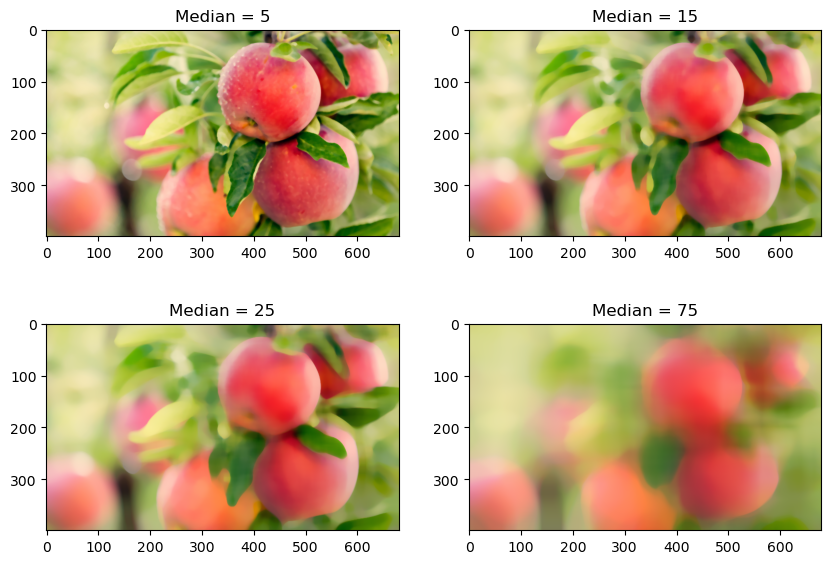

In [14]:
#Làm mịn ảnh với các kernel khác nhau sử dụng bộ lọc trung vị:
#ksize = 5:
median_5 = cv2.medianBlur(img_orignal,5)

#ksize = 15:
median_15 = cv2.medianBlur(img_orignal,15)

#ksize =  25:
median_25 = cv2.medianBlur(img_orignal,25)

#ksize = 75:
median_75 = cv2.medianBlur(img_orignal,75)

#Hiển thị kết quả:
plt.figure(figsize=(10,7))
plt.subplot(2, 2, 1)
plt.imshow(median_5)
plt.title('Median = 5')

plt.subplot(2, 2, 2)
plt.imshow(median_15)
plt.title('Median = 15')

plt.subplot(2, 2, 3)
plt.imshow(median_25)
plt.title('Median = 25')

plt.subplot(2, 2, 4)
plt.imshow(median_75)
plt.title('Median = 75')

plt.show()

**3. phương thức lọc Gaussian cv2.GaussianBlur():**
Đây là một trong những phương pháp làm mịn hữu ích.Lọc Gaussian được thực hiện bằng cách xoay từng điểm trong mảng đầu vào với một hạt nhân Gaussian và sau đó tổng hợp tất cả chúng để tạo ra mảng đầu ra.

**cv2.GaussianBlur(src, kernel,sigmaX, sigmaY)**

Ý nghĩa các tham số:

1. src: ảnh gốc cần thay đổi kích thước.
2. kernel (width, height): Kích thước cửa sổ trượt, phải là số dương và lẻ.
    
    
Xem thêm thông tin về smoothing trong OpenCV: https://docs.opencv.org/3.4/dc/dd3/tutorial_gausian_median_blur_bilateral_filter.html

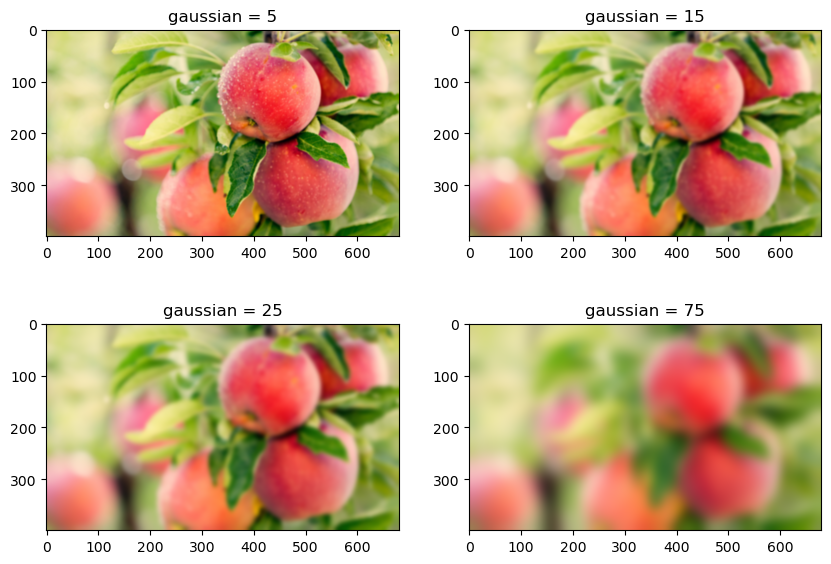

In [15]:
#Làm mịn ảnh với các kernel khác nhau sử dụng bộ lọc Gaussian:
#kernel = 5 x 5:
gaussian_5 = cv2.GaussianBlur(img_orignal,(5,5),0)

#kernel = 15 x 15:
gaussian_15 = cv2.GaussianBlur(img_orignal,(15,15),0)

#kernel = 25 x 25:
gaussian_25 = cv2.GaussianBlur(img_orignal,(25,25),0)

#kernel = 75 x 75:
gaussian_75 = cv2.GaussianBlur(img_orignal,(75,75),0)

#Hiển thị kết quả:
plt.figure(figsize=(10,7))
plt.subplot(2, 2, 1)
plt.imshow(gaussian_5)
plt.title('gaussian = 5')

plt.subplot(2, 2, 2)
plt.imshow(gaussian_15)
plt.title('gaussian = 15')

plt.subplot(2, 2, 3)
plt.imshow(gaussian_25)
plt.title('gaussian = 25')

plt.subplot(2, 2, 4)
plt.imshow(gaussian_75)
plt.title('gaussian = 75')

plt.show()

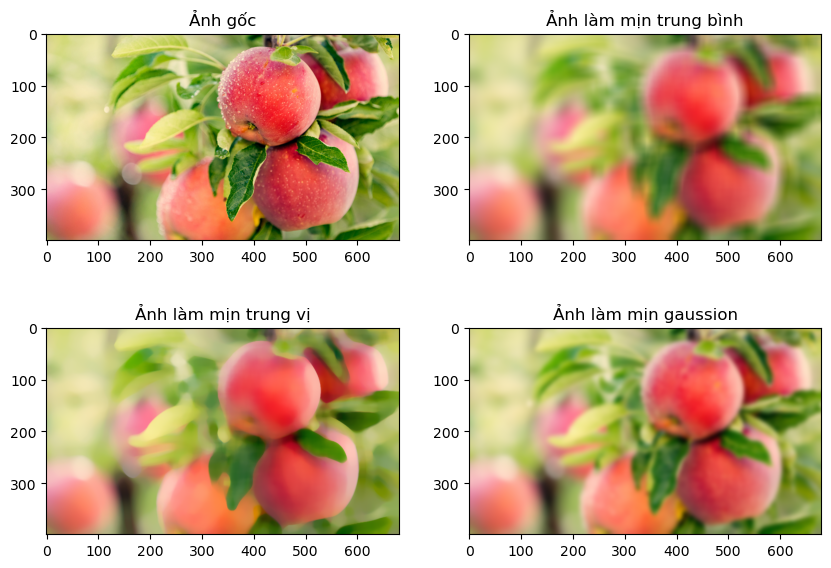

In [18]:
#So sánh các phương pháp làm mịn ảnh khác nhau:
plt.figure(figsize=(10,7))

plt.subplot(2,2,1)
plt.imshow(img_orignal)
plt.title('Ảnh gốc')

plt.subplot(2,2,2)
plt.imshow(img_apple_25)
plt.title('Ảnh làm mịn trung bình')

plt.subplot(2,2,3)
plt.imshow(median_25)
plt.title('Ảnh làm mịn trung vị')

plt.subplot(2,2,4)
plt.imshow(gaussian_25)
plt.title('Ảnh làm mịn gaussion')

plt.show()

## THỰC HÀNH 2.8: 
---
**Yêu cầu 1:** Sinh viên đọc ảnh images/Thuchanh2_8.jpeg, dạng xám và hiển thị ảnh

**Yêu cầu 2:** Sử dụng phương pháp làm mịn trung bình với kernel 5x5, 10x10, 20x30 và hiển thị kết quả

**Yêu cầu 3:** Sử dụng phương pháp làm mịn trung vị với k =  7, 11, 21 và hiển thị kết quả

**Yêu cầu 4:** Sử dụng phương pháp làm mịn Gaussian với kernel = (7,7) và sigmaY, sigmaY lần lượt là (0,0); (0,20); (20,0) và hiển thị kết quả

<img src='images/Thuchanh2_8.jpeg' width='400px'>

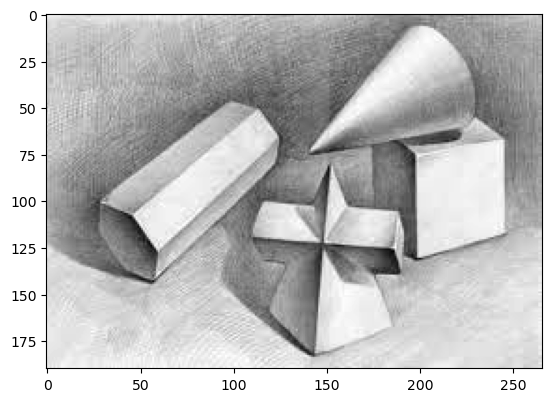

In [88]:
#{SINH VIÊN VIẾT CODE VÀO ĐÂY}
# YÊU CẦU 1: Đọc ảnh
img_th2_8 = cv2.imread('images/Thuchanh2_8.jpeg',0)
plt.imshow(img_th2_8, cmap='gray')
plt.show()

**Yêu cầu 2:** Sử dụng phương pháp làm mịn trung bình với kernel 5x5, 10x10, 20x30 và hiển thị kết quả

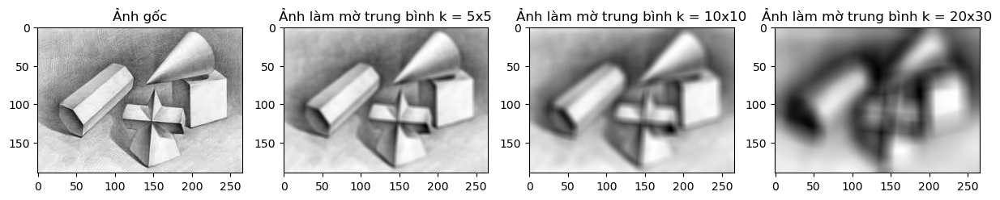

In [93]:
# Thực hiện làm mịn (làm mờ) trung bình
img_th2_8_5x5 = cv2.blur(img_th2_8, (5,5))
img_th2_8_10x10 = cv2.blur(img_th2_8, (10,10))
img_th2_8_20x30 = cv2.blur(img_th2_8, (20,30))

# hiển thị kết quả
plt.figure(figsize=(15,5))
plt.subplot(1,4,1)
plt.imshow(img_th2_8,cmap='gray')
plt.title('Ảnh gốc')

plt.subplot(1,4,2)
plt.imshow(img_th2_8_5x5,cmap='gray')
plt.title('Ảnh làm mờ trung bình k = 5x5')

plt.subplot(1,4,3)
plt.imshow(img_th2_8_10x10,cmap='gray')
plt.title('Ảnh làm mờ trung bình k = 10x10')

plt.subplot(1,4,4)
plt.imshow(img_th2_8_20x30,cmap='gray')
plt.title('Ảnh làm mờ trung bình k = 20x30')

plt.show()

**Yêu cầu 3:** Sử dụng phương pháp làm mịn trung vị với k =  7, 11, 21 và hiển thị kết quả

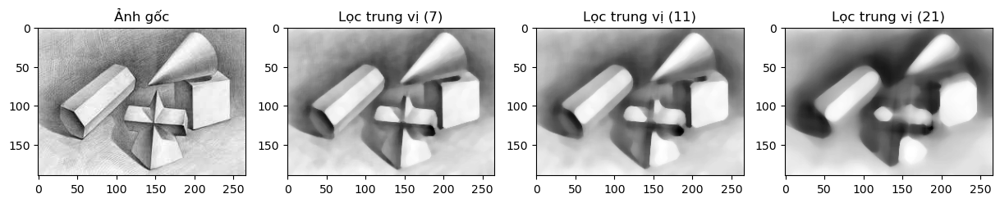

In [96]:
#Làm mịn ảnh với các kernel khác nhau sử dụng bộ lọc trung vị:
#ksize = 7:
th2_8_median_7 = cv2.medianBlur(img_th2_8,7)

#ksize = 11:
th2_8_median_11 = cv2.medianBlur(img_th2_8,11)

#ksize =  21:
th2_8_median_21 = cv2.medianBlur(img_th2_8,21)


#Hiển thị kết quả:
plt.figure(figsize=(15,7))
plt.subplot(1, 4, 1)
plt.imshow(img_th2_8,cmap='gray')
plt.title('Ảnh gốc')

plt.subplot(1, 4, 2)
plt.imshow(th2_8_median_7,cmap='gray')
plt.title('Lọc trung vị (7)')

plt.subplot(1, 4, 3)
plt.imshow(th2_8_median_11,cmap='gray')
plt.title('Lọc trung vị (11)')

plt.subplot(1, 4, 4)
plt.imshow(th2_8_median_21,cmap='gray')
plt.title('Lọc trung vị (21)')

plt.show()

**Yêu cầu 4:** Sử dụng phương pháp làm mịn Gaussian với kernel = (7,7) và sigmaY, sigmaY lần lượt là (0,0); (0,20); (20,0) và hiển thị kết quả

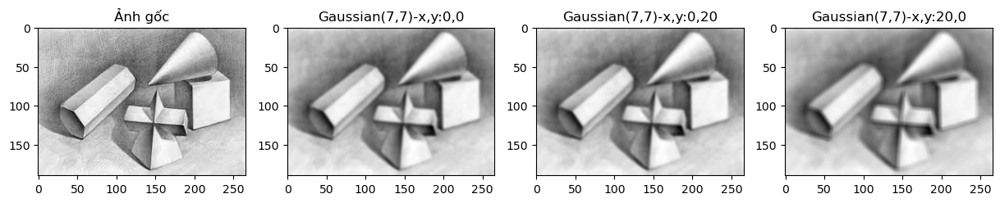

In [100]:
#Làm mịn ảnh với các kernel khác nhau sử dụng bộ lọc Gaussian:
#kernel = 7 x 7, (sigmaX,sigmaY) = (0,0):
th2_8_gaussian_1 = cv2.GaussianBlur(img_th2_8,(7,7),0)

#kernel = 7 x 7, (sigmaX,sigmaY) = (0,20):
th2_8_gaussian_2 = cv2.GaussianBlur(img_th2_8,(7,7),0,20)

#kernel = 7 x 7, (sigmaX,sigmaY) = (20,0):
th2_8_gaussian_3 = cv2.GaussianBlur(img_th2_8,(7,7),20,0)


#Hiển thị kết quả:
plt.figure(figsize=(15,7))
plt.subplot(1, 4, 1)
plt.imshow(img_th2_8,cmap='gray')
plt.title('Ảnh gốc')

plt.subplot(1, 4, 2)
plt.imshow(th2_8_gaussian_1,cmap='gray')
plt.title('Gaussian(7,7)-x,y:0,0')

plt.subplot(1, 4, 3)
plt.imshow(th2_8_gaussian_2,cmap='gray')
plt.title('Gaussian(7,7)-x,y:0,20')

plt.subplot(1, 4, 4)
plt.imshow(th2_8_gaussian_3,cmap='gray')
plt.title('Gaussian(7,7)-x,y:20,0')

plt.show()

## 2. Nhiễu và khử nhiễu trong ảnh
---
Khái niệm: Nhiễu xuất hiện trong quá trình thu nhận ảnh, số hoá và truyền ảnh. 
* Cảm biến ảnh có thể bị ảnh hưởng bởi các điều kiện môi trường.
* Nhiễu có thể can thiệp vào ảnh trong quá trình truyền ảnh.
* Lượng tử hoá
* Số hoá.

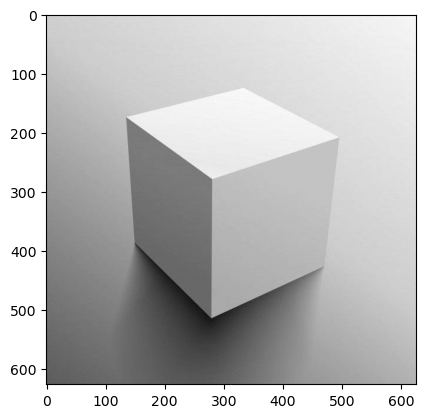

In [19]:
import numpy as np 
import cv2
import matplotlib.pyplot as plt 

# Đọc ảnh
img = cv2.imread('images/pic_square.jpeg',0)
m,n = img.shape[:2]

plt.imshow(img,cmap='gray')
plt.show()

## Một số loại nhiễu cơ bản
---
1. Nhiễu Gaussian
2. Nhiễu Rayleigh 
3. Nhiễu Erlang (Gammar)
4. Nhiễu hàm mũ
5. Nhiễu đồng nhất (Uniform) 
6. Nhiễu muối tiêu

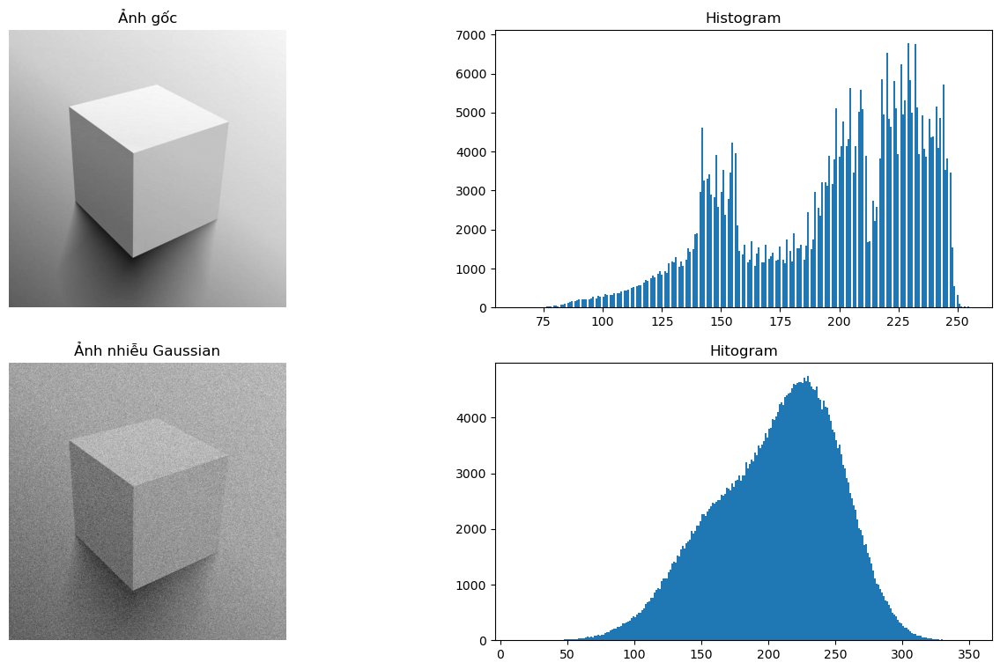

In [20]:
# Thêm nhiễu Gaussian vào ảnh img
gia_tri_TB = 10
phuong_sai = 25
noise = np.random.normal(loc=gia_tri_TB,scale=phuong_sai,size=(m,n))
Gau_noisy_img = img + noise

# 1. Hiển thị ảnh gốc, ảnh nhiễu và histogram
# Tạo cửa số 1 để hiển thị ảnh cho nhiễu Gaussian
fig1 = plt.figure(figsize=(16, 9))  # Tạo vùng vẽ tỷ lệ 16:9
#Tạo 9 vùng vẽ con
(ax1, ax2), (ax3, ax4) = fig1.subplots(2, 2)
# Hiển thị ảnh gốc
ax1.imshow(img, cmap='gray')
ax1.set_title('Ảnh gốc')
ax1.axis('off')
# Hiển thị histogram ảnh gốc
ax2.hist(img.flatten(),bins=256)
ax2.set_title('Histogram')
# Hiển thị ảnh nhiễu Gaussian
ax3.imshow(Gau_noisy_img, cmap='gray')
ax3.set_title('Ảnh nhiễu Gaussian')
ax3.axis('off')
# Hiển thị histogram ảnh nhiễu gaussian
ax4.hist(Gau_noisy_img.flatten(),bins=256)
ax4.set_title('Hitogram')
plt.show()

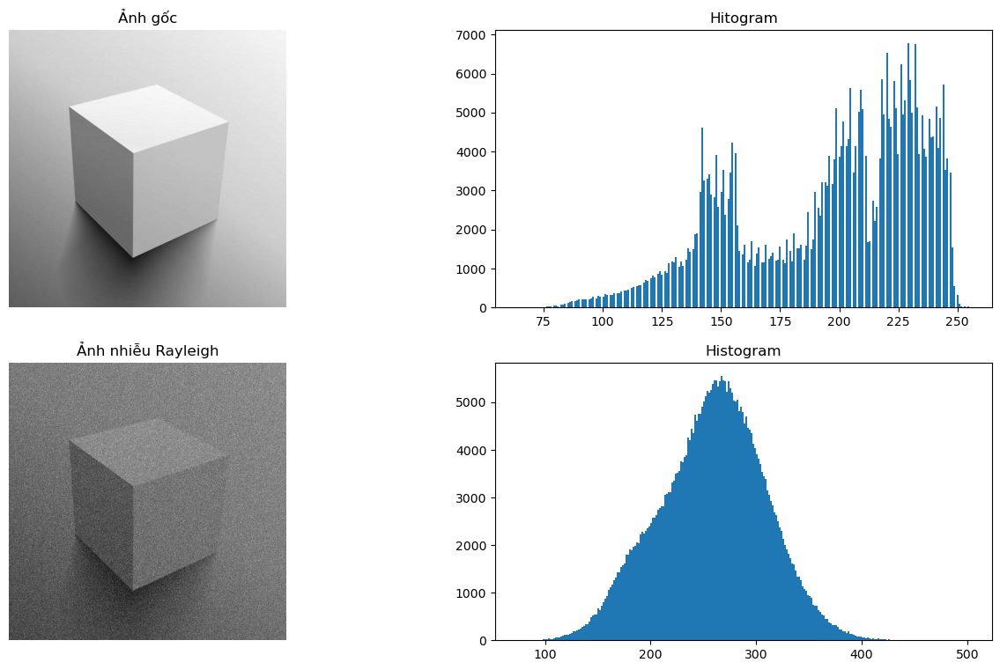

In [21]:
# Thêm nhiễu Rayleigh vào ảnh img
phuong_sai = 50
noise = np.random.rayleigh(scale=phuong_sai,size=(m,n))
Ray_noisy_img = img + noise

# 2. Tạo cửa số 2 để hiển thị ảnh cho nhiễu Rayleigh
fig2 = plt.figure(figsize=(16, 9))  # Tạo vùng vẽ tỷ lệ 16:9
#Tạo 9 vùng vẽ con
(ax1, ax2), (ax3, ax4) = fig2.subplots(2, 2)
# Hiển thị ảnh gốc
ax1.imshow(img, cmap='gray')
ax1.set_title('Ảnh gốc')
ax1.axis('off')
# Hiển thị histogram ảnh gốc
ax2.hist(img.flatten(),bins=256)
ax2.set_title('Hitogram')
# Hiển thị ảnh nhiễu Rayleigh
ax3.imshow(Ray_noisy_img, cmap='gray')
ax3.set_title('Ảnh nhiễu Rayleigh')
ax3.axis('off')
# Hiển thị histogram ảnh nhiễu Rayleigh
ax4.hist(Ray_noisy_img.flatten(),bins=256)
ax4.set_title('Histogram')
plt.show()

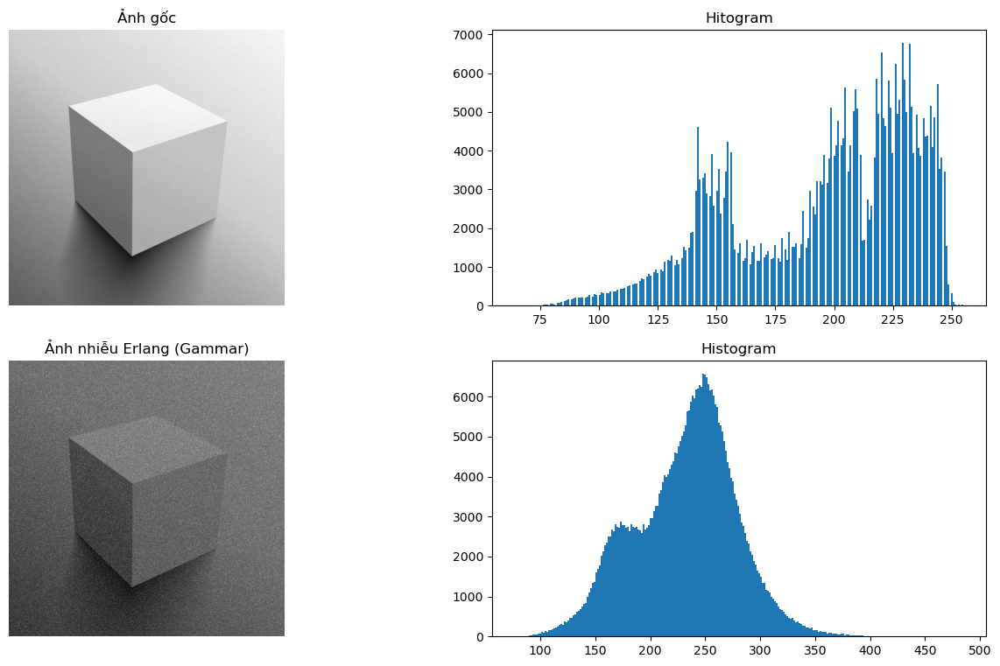

In [22]:
# Thêm nhiễu Erlang (Gammar) vào ảnh img
K = 2.0
phuong_sai = 18
noise = np.random.gamma(shape=K,scale=phuong_sai,size=(m,n))
Gam_noisy_img = img + noise

# 3. Tạo cửa số 3 để hiển thị ảnh cho nhiễu Erlang (Gamma)
fig2 = plt.figure(figsize=(16, 9))  # Tạo vùng vẽ tỷ lệ 16:9
#Tạo 9 vùng vẽ con
(ax1, ax2), (ax3, ax4) = fig2.subplots(2, 2)
# Hiển thị ảnh gốc
ax1.imshow(img, cmap='gray')
ax1.set_title('Ảnh gốc')
ax1.axis('off')
# Hiển thị histogram ảnh gốc
ax2.hist(img.flatten(),bins=256)
ax2.set_title('Hitogram')
# Hiển thị ảnh nhiễu Erlang (Gammar)
ax3.imshow(Gam_noisy_img, cmap='gray')
ax3.set_title('Ảnh nhiễu Erlang (Gammar)')
ax3.axis('off')
# Hiển thị histogram ảnh nhiễu Erlang (Gammar)
ax4.hist(Gam_noisy_img.flatten(),bins=256)
ax4.set_title('Histogram')
plt.show()

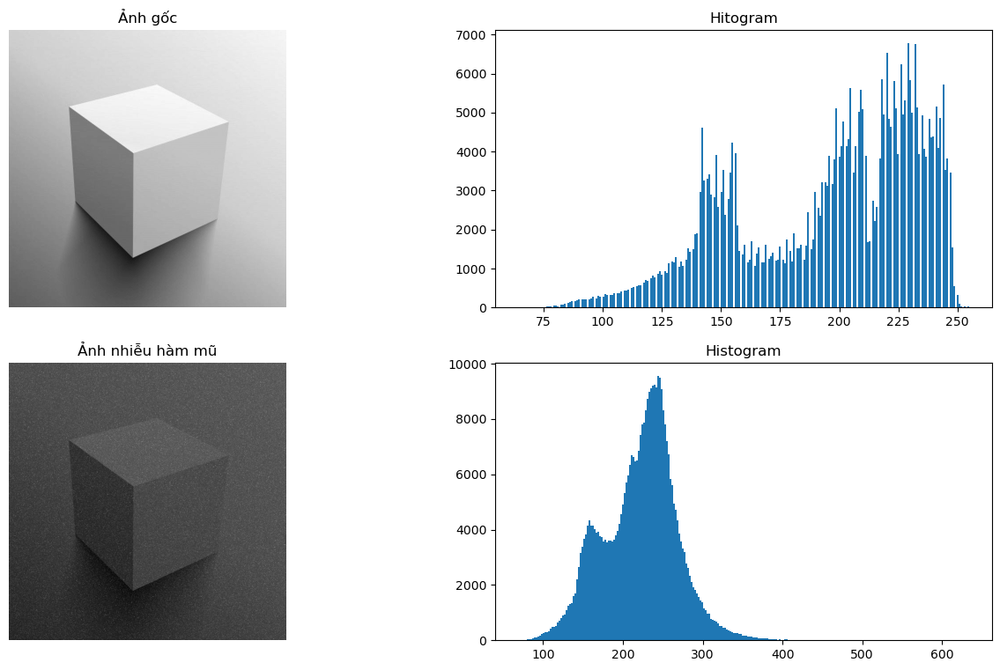

In [23]:
# Thêm nhiễu hàm mũ vào ảnh img
phuong_sai = 26
noise = np.random.exponential(scale=phuong_sai,size=(m,n))
Exp_noisy_img = img + noise

# 4. Tạo cửa số 4 để hiển thị ảnh cho nhiễu nhiễu hàm mũ
fig2 = plt.figure(figsize=(16, 9))  # Tạo vùng vẽ tỷ lệ 16:9
#Tạo 4 vùng vẽ con
(ax1, ax2), (ax3, ax4) = fig2.subplots(2, 2)
# Hiển thị ảnh gốc
ax1.imshow(img, cmap='gray')
ax1.set_title('Ảnh gốc')
ax1.axis('off')
# Hiển thị histogram ảnh gốc
ax2.hist(img.flatten(),bins=256)
ax2.set_title('Hitogram')
# Hiển thị ảnh nhiễu nhiễu hàm mũ
ax3.imshow(Exp_noisy_img, cmap='gray')
ax3.set_title('Ảnh nhiễu hàm mũ')
ax3.axis('off')
# Hiển thị histogram ảnh nhiễu nhiễu hàm mũ
ax4.hist(Exp_noisy_img.flatten(),bins=256)
ax4.set_title('Histogram')
plt.show()


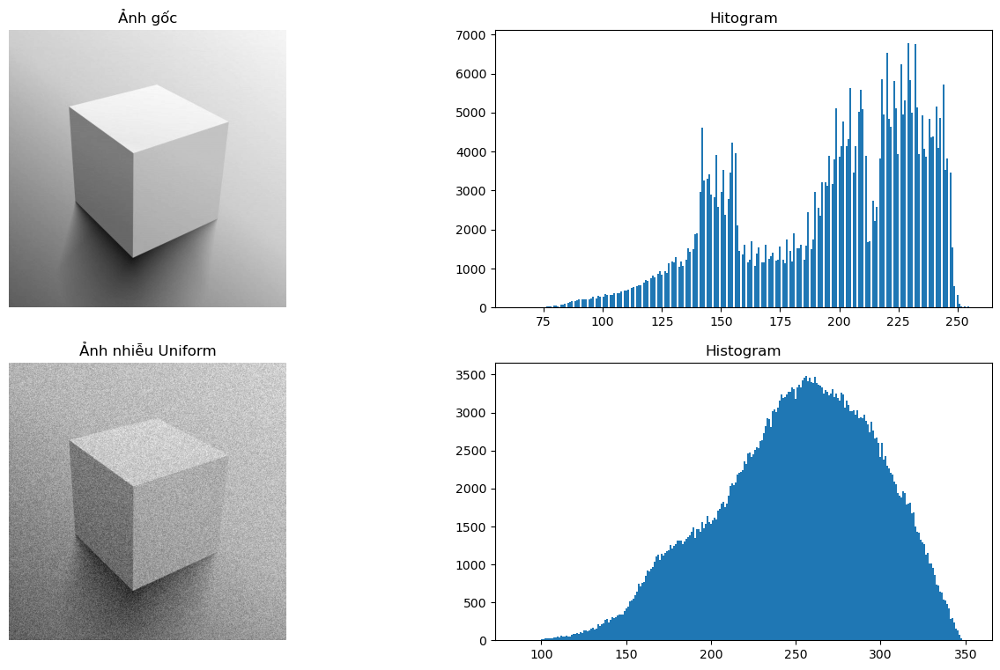

In [24]:
# Thêm nhiễu Uniform vào ảnh img
a,b = 10,100
noise = np.random.uniform(low=a,high=b,size=(m,n))
Uni_noisy_img = img + noise

# 5. Tạo cửa số 5 để hiển thị ảnh cho nhiễu nhiễu Uniform
fig2 = plt.figure(figsize=(16, 9))  # Tạo vùng vẽ tỷ lệ 16:9
#Tạo 4 vùng vẽ con
(ax1, ax2), (ax3, ax4) = fig2.subplots(2, 2)
# Hiển thị ảnh gốc
ax1.imshow(img, cmap='gray')
ax1.set_title('Ảnh gốc')
ax1.axis('off')
# Hiển thị histogram ảnh gốc
ax2.hist(img.flatten(),bins=256)
ax2.set_title('Hitogram')
# Hiển thị ảnh nhiễu nhiễu Uniform
ax3.imshow(Uni_noisy_img, cmap='gray')
ax3.set_title('Ảnh nhiễu Uniform')
ax3.axis('off')
# Hiển thị histogram ảnh nhiễu Uniform
ax4.hist(Uni_noisy_img.flatten(),bins=256)
ax4.set_title('Histogram')
plt.show()


## Cách tạo nhiễu cho ảnh:
---

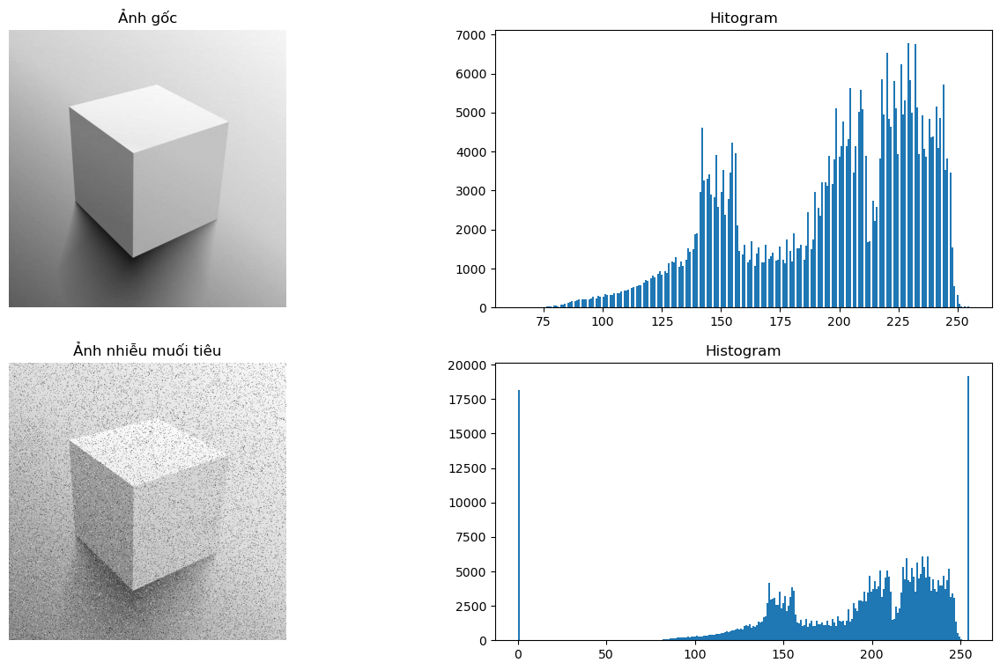

In [25]:
# Thêm nhiễu muối tiêu (add salt and pepper) vào ảnh img
number_black = int(m*n*0.05)  # định nghĩa số điểm đen
number_white = int(m*n*0.05)  # định nghĩa số điểm trắng
# Lấy giá trị nguyên ngẫu nhiên trong đoạn 0..m
# Giá trị này sẽ biểu diễn tọa độ điểm đen theo hàng
m_blacks = np.random.randint(0,m,number_black)
# Lấy giá trị nguyên ngẫu nhiên trong đoạn 0..n
# Giá trị này sẽ biểu diễn tọa độ điểm đen theo cột
n_blacks = np.random.randint(0,n,number_black)
# Lấy giá trị nguyên ngẫu nhiên trong đoạn 0..m
# Giá trị này sẽ biểu diễn tọa độ điểm trắng theo hàng
m_whites = np.random.randint(0,m,number_white)
# Lấy giá trị nguyên ngẫu nhiên trong đoạn 0..n
# Giá trị này sẽ biểu diễn tọa độ điểm trắng theo cột
n_whites = np.random.randint(0,n,number_white)

SP_noisy_img = np.copy(img) # Sao chép ảnh img để tạo ảnh SP_noisy_img
# Thiết lập mức xám = 0 (điểm đen) cho điểm ảnh có tọa độ (m_blacks,n_blacks)
SP_noisy_img[m_blacks,n_blacks] = 0
# Thiết lập mức xám = 255 (điểm trắng) cho điểm ảnh có tọa độ (m_whites,n_whites)
SP_noisy_img[m_whites,n_whites] = 255


# 6. Tạo cửa số 6 để hiển thị ảnh cho nhiễu nhiễu muối tiêu (nhiễu xung)
fig2 = plt.figure(figsize=(16, 9))  # Tạo vùng vẽ tỷ lệ 16:9
#Tạo 4 vùng vẽ con
(ax1, ax2), (ax3, ax4) = fig2.subplots(2, 2)
# Hiển thị ảnh gốc
ax1.imshow(img, cmap='gray')
ax1.set_title('Ảnh gốc')
ax1.axis('off')
# Hiển thị histogram ảnh gốc
ax2.hist(img.flatten(),bins=256)
ax2.set_title('Hitogram')
# Hiển thị ảnh nhiễu nhiễu muối tiêu (nhiễu xung)
ax3.imshow(SP_noisy_img, cmap='gray')
ax3.set_title('Ảnh nhiễu muối tiêu')
ax3.axis('off')
# Hiển thị histogram ảnh nhiễu muối tiêu (nhiễu xung)
ax4.hist(SP_noisy_img.flatten(),bins=256)
ax4.set_title('Histogram')
plt.show()

## Sử dụng bộ lọc làm mịn để khử nhiễu trong ảnh:
---

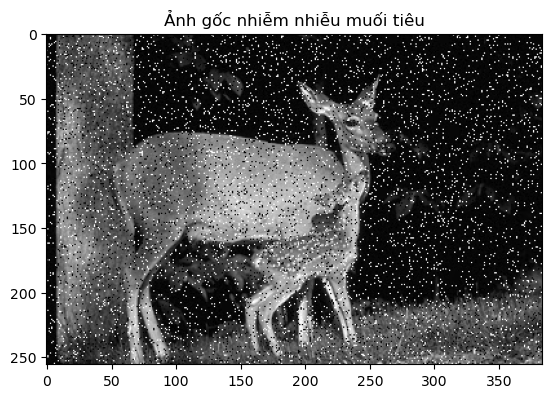

In [28]:
#Đọc ảnh gốc bị nhiễu:
img_noise = cv2.imread('images/deer_salt.jpg',0)

# Hiển thị hình ảnh
plt.imshow(img_noise,cmap='gray')
plt.title('Ảnh gốc nhiễm nhiễu muối tiêu')
plt.show()




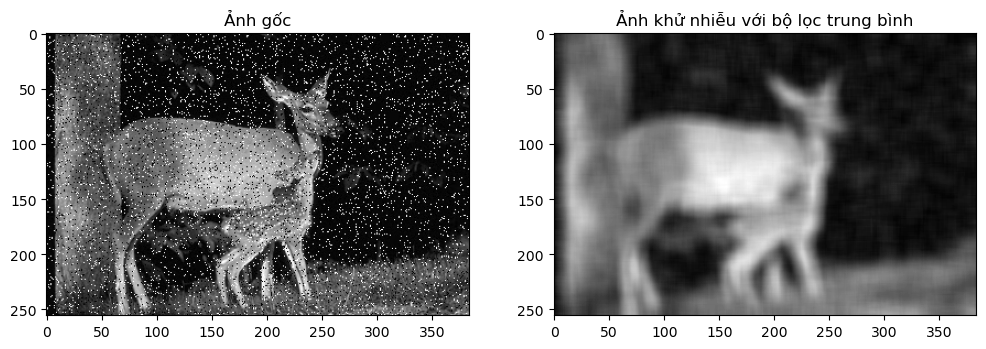

In [31]:
# Khử nhiễu bộ lọc trung bình
k = (15,15)
img_deer1_mean = cv2.blur(img_noise,k)

# Hiển thị hình ảnh 
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(img_noise,cmap='gray')
plt.title('Ảnh gốc')

plt.subplot(1,2,2)
plt.imshow(img_deer1_mean,cmap='gray')
plt.title('Ảnh khử nhiễu với bộ lọc trung bình')

plt.show()

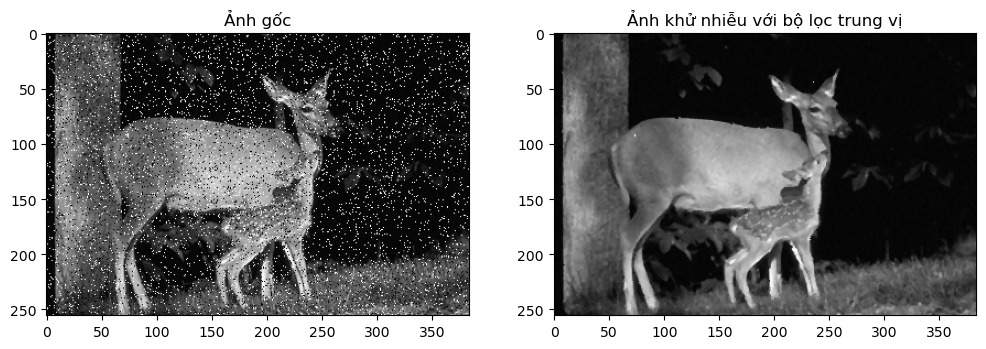

In [40]:
# Khử nhiễu với bộ lọc trung vị
k = 3
img_deer1_median = cv2.medianBlur(img_noise,k)

# Hiển thị hình ảnh 
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(img_noise,cmap='gray')
plt.title('Ảnh gốc')

plt.subplot(1,2,2)
plt.imshow(img_deer1_median,cmap='gray')
plt.title('Ảnh khử nhiễu với bộ lọc trung vị')

plt.show()

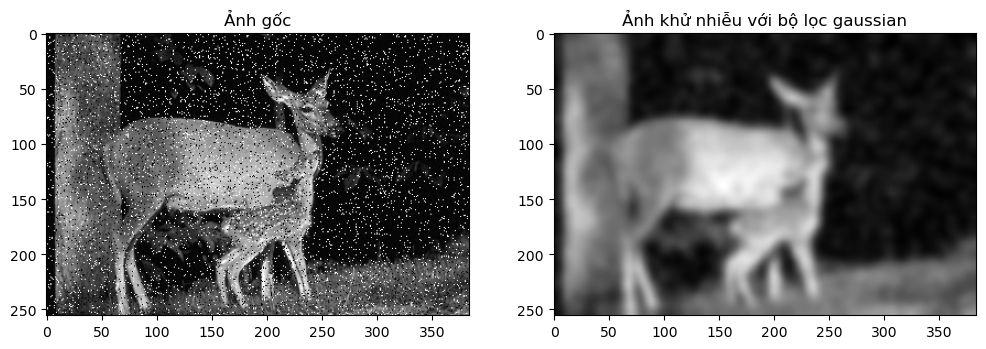

In [39]:
# Khử nhiễu vơi bộ lọc gaussion
k = (25,25)
img_deer1_gaussian = cv2.GaussianBlur(img_noise,k,0)

# Hiển thị hình ảnh 
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(img_noise,cmap='gray')
plt.title('Ảnh gốc')

plt.subplot(1,2,2)
plt.imshow(img_deer1_gaussian,cmap='gray')
plt.title('Ảnh khử nhiễu với bộ lọc gaussian')

plt.show()

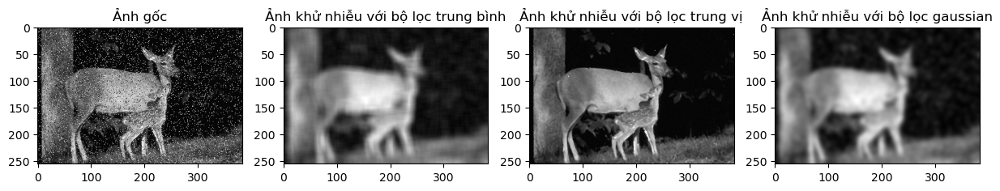

In [42]:
# Hiển thị ba phương án khử nhiễu
plt.figure(figsize=(15,5))
plt.subplot(1,4,1)
plt.imshow(img_noise,cmap='gray')
plt.title('Ảnh gốc')

plt.subplot(1,4,2)
plt.imshow(img_deer1_mean,cmap='gray')
plt.title('Ảnh khử nhiễu với bộ lọc trung bình')

plt.subplot(1,4,3)
plt.imshow(img_deer1_median,cmap='gray')
plt.title('Ảnh khử nhiễu với bộ lọc trung vị')

plt.subplot(1,4,4)
plt.imshow(img_deer1_gaussian,cmap='gray')
plt.title('Ảnh khử nhiễu với bộ lọc gaussian')

plt.show()

## THỰC HÀNH 2.9: 
---
**Yêu cầu 1:** Sinh viên đọc ảnh images/Thuchanh2_9_1.jpeg. Lựa chọn phương pháp khử nhiễu và các tham số phù hợp để thu được ảnh khử nhiễu tốt nhất. Lưu ảnh đã xử lý vào thư mục images/Saves/MSV_brain.png

<img src='images/Thuchanh2_9_1.jpeg' width='200px'>

**Yêu cầu 2:** Sinh viên đọc ảnh images/Thuchanh2_9_2.png và hiển thị ảnh. Lựa chọn phương pháp khử nhiễu và các tham số phù hợp để thu được ảnh khử nhiễu tốt nhất. Lưu ảnh đã xử lý vào thư mục images/Saves/MSV_plane.png

<img src='images/Thuchanh2_9_2.png' width='200px'>

In [47]:
#{SINH VIÊN VIẾT CODE VÀO ĐÂY}
# đọc ảnh bộ não
img_brain = cv2.imread('images/Thuchanh2_9_1.jpeg',0)


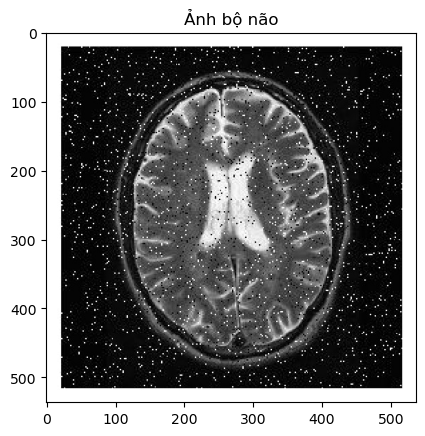

In [49]:
plt.imshow(img_brain,cmap='gray')
plt.title('Ảnh bộ não')
plt.show()

In [52]:
# Khử nhiễu bộ lọc trung bình
img_brain_mean = cv2.blur(img_brain,(15,15))
# Khử nhiễu với bộ lọc trung vị
img_brain_median = cv2.medianBlur(img_brain,3)
# Khử nhiễu với bộ lọc gaussian
img_brain_gaussian = cv2.GaussianBlur(img_brain,(25,25),0)

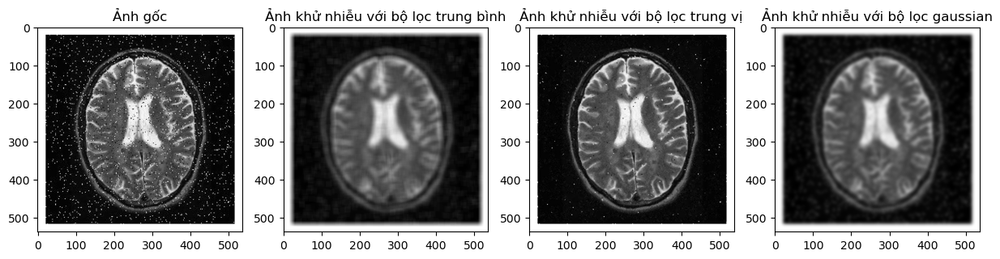

In [53]:
plt.figure(figsize=(15,5))
plt.subplot(1,4,1)
plt.imshow(img_brain,cmap='gray')
plt.title('Ảnh gốc')

plt.subplot(1,4,2)
plt.imshow(img_brain_mean,cmap='gray')
plt.title('Ảnh khử nhiễu với bộ lọc trung bình')

plt.subplot(1,4,3)
plt.imshow(img_brain_median,cmap='gray')
plt.title('Ảnh khử nhiễu với bộ lọc trung vị')

plt.subplot(1,4,4)
plt.imshow(img_brain_gaussian,cmap='gray')
plt.title('Ảnh khử nhiễu với bộ lọc gaussian')

plt.show()

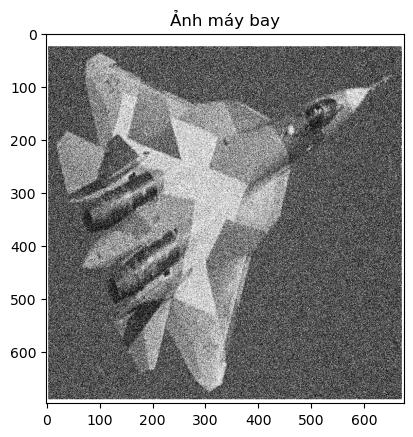

In [54]:
# đọc ảnh máy bay
img_plane = cv2.imread('images/Thuchanh2_9_2.png',0)
plt.imshow(img_plane,cmap='gray')
plt.title('Ảnh máy bay')
plt.show()

In [61]:
# Khử nhiễu bộ lọc trung bình
img_plane_mean = cv2.blur(img_plane,(15,15))
# Khử nhiễu với bộ lọc trung vị
img_plane_median = cv2.medianBlur(img_plane,9)
# Khử nhiễu với bộ lọc gaussian
img_plane_gaussian = cv2.GaussianBlur(img_plane,(25,25),0)

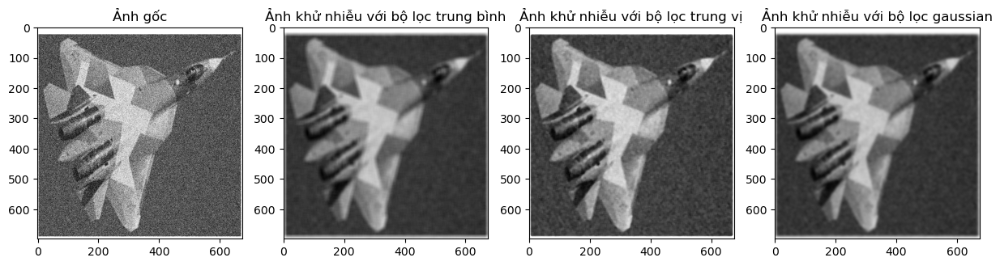

In [63]:
plt.figure(figsize=(15,5))
plt.subplot(1,4,1)
plt.imshow(img_plane,cmap='gray')
plt.title('Ảnh gốc')

plt.subplot(1,4,2)
plt.imshow(img_plane_mean,cmap='gray')
plt.title('Ảnh khử nhiễu với bộ lọc trung bình')

plt.subplot(1,4,3)
plt.imshow(img_plane_median,cmap='gray')
plt.title('Ảnh khử nhiễu với bộ lọc trung vị')

plt.subplot(1,4,4)
plt.imshow(img_plane_gaussian,cmap='gray')
plt.title('Ảnh khử nhiễu với bộ lọc gaussian')

plt.show()

## 3. Nhân tích chập - Lọc ảnh 2D (Convolution)
---
Nguyên tắc chung của các phương pháp lọc là cho ma trận ảnh nhân với một ma trận lọc (Kernel). Ma trận lọc lọc (Kernel) còn có thể được gọi là cửa sổ chập (trong phép nhân chập), cửa sổ lọc, mặt nạ,…Việc nhân ảnh với ma trận lọc giống như việc trượt ma trận lọc theo hàng trên ảnh và nhân với từng vùng của ảnh, cộng các kết quả lại tạo thành kết quả của điểm ảnh trung tâm.

Với mỗi phép lọc ta có những ma trận lọc (Kernel) khác nhau, không có một quy định cụ thể nào cho việc xác định M. Kích thước ma trận M là một số lẻ. Ví dụ: 3x3, 5x5.

OpenCV hỗ trợ phương thức lọc ảnh 2D:
 **cv2.filter2D(img,ddepth, kernel)**
 
 Trong đó:
1. img: ảnh gốc muốn áp dụng bộ lọc
2. ddepth: Độ sâu của ảnh đầu ra; -1: độ sâu của ảnh đầu ra bằng độ sâu của ảnh đầu vào.
3. kernel: ma trận lọc

https://www.geeksforgeeks.org/python-opencv-filter2d-function/

https://setosa.io/ev/image-kernels/

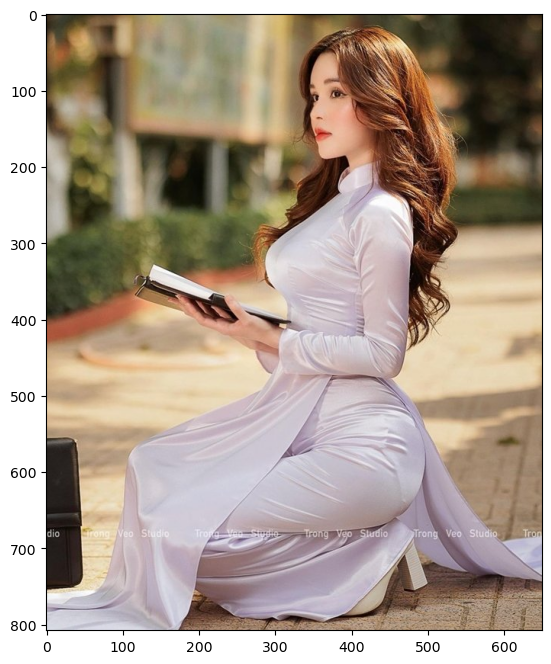

In [64]:
#Đọc ảnh:
img = cv2.imread('images/Pic_1.jpg',1)

#Đổi hệ màu:
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

#Hiển thị ảnh:
plt.figure(figsize=(8,8))
plt.imshow(img,cmap='gray')
plt.show()

## Một số bộ lọc thông dụng:
---
### 1. Bộ lọc identity:

In [66]:
#Khởi tạo kernel:
kernel_identity = np.array([[0,0,0],
                          [0,1,0],
                          [0,0,0]])
print('Kernel identity\n',kernel_identity)


Kernel identity
 [[0 0 0]
 [0 1 0]
 [0 0 0]]


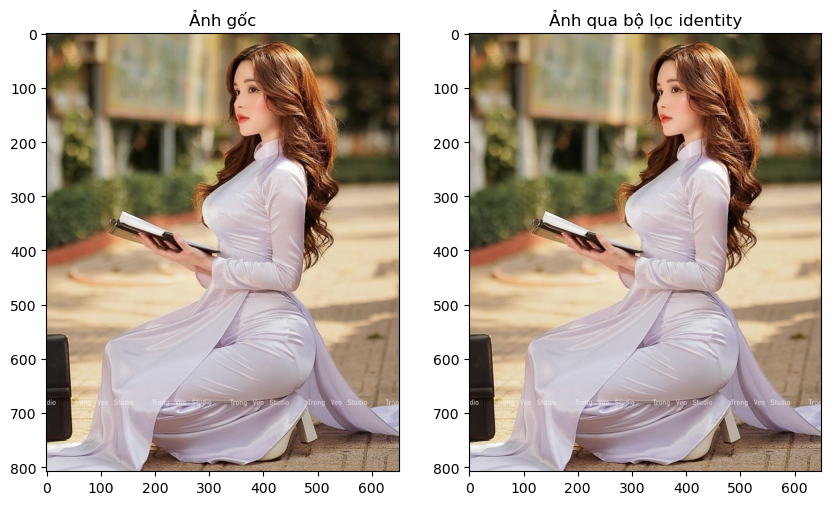

In [67]:
#Thực hiện lọc ảnh với kernel ở trên:
img_identity = cv2.filter2D(img,-1,kernel_identity)

# Hiển thịu hình ảnh
plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
plt.imshow(img)
plt.title('Ảnh gốc')

plt.subplot(1,2,2)
plt.imshow(img_identity)
plt.title('Ảnh qua bộ lọc identity')

plt.show()

In [68]:
# Hiển thị ảnh gốc
img[:,:,0]

array([[ 55,  58,  61, ...,  44,  39,  40],
       [ 59,  62,  65, ...,  47,  44,  42],
       [ 59,  62,  65, ...,  49,  48,  48],
       ...,
       [214, 214, 215, ..., 172, 162, 170],
       [215, 216, 216, ..., 175, 169, 171],
       [217, 217, 217, ..., 172, 172, 164]], dtype=uint8)

In [69]:
# Hiển thị ảnh qua bộ loc
img_identity[:,:,0] # --> không làm thay đổi ảnh gốc

array([[ 55,  58,  61, ...,  44,  39,  40],
       [ 59,  62,  65, ...,  47,  44,  42],
       [ 59,  62,  65, ...,  49,  48,  48],
       ...,
       [214, 214, 215, ..., 172, 162, 170],
       [215, 216, 216, ..., 175, 169, 171],
       [217, 217, 217, ..., 172, 172, 164]], dtype=uint8)

### 2. Bộ lọc phát hiện góc của ảnh (Edge detection))

In [74]:
#Khởi tạo kernel:
kernel_edge = np.array([[-1,-1,-1],
                        [-1,8,-1],
                        [-1,-1,-1]])
print('Bộ lọc Edge:\n',kernel_edge)



Bộ lọc Edge:
 [[-1 -1 -1]
 [-1  8 -1]
 [-1 -1 -1]]


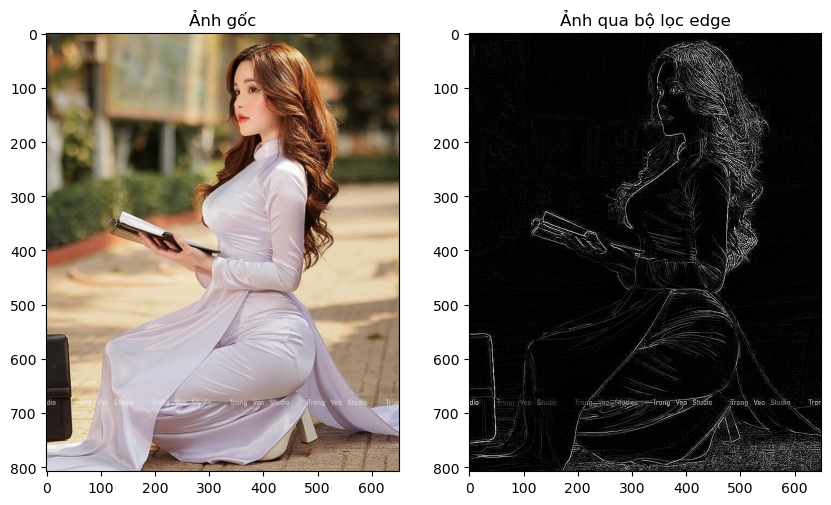

In [75]:
#Thực hiện lọc ảnh với kernel ở trên:
img_edge = cv2.filter2D(img,-1,kernel_edge)

# Hiển thịu hình ảnh
plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
plt.imshow(img)
plt.title('Ảnh gốc')

plt.subplot(1,2,2)
plt.imshow(img_edge)
plt.title('Ảnh qua bộ lọc edge')

plt.show()

In [76]:
# Dữ liệu gốc
img[:,:,0]

array([[ 55,  58,  61, ...,  44,  39,  40],
       [ 59,  62,  65, ...,  47,  44,  42],
       [ 59,  62,  65, ...,  49,  48,  48],
       ...,
       [214, 214, 215, ..., 172, 162, 170],
       [215, 216, 216, ..., 175, 169, 171],
       [217, 217, 217, ..., 172, 172, 164]], dtype=uint8)

In [77]:
# Dữ liệu qua bộ lọc edge
img_edge[:,:,0]

array([[  0,   0,   0, ...,   0,   0,   0],
       [  0,  12,  16, ...,   8,   0,   0],
       [  0,   2,   6, ...,   0,   1,   5],
       ...,
       [  0,   0,   0, ..., 101,   6, 102],
       [  0,   3,   1, ...,  41,   0,  28],
       [  8,   8,   6, ...,   0,  10,   0]], dtype=uint8)

### 3. Bộ lọc sắc nét Sharpen kernel:

In [80]:
#Khởi tạo kernel:
kernel_sharpen = np.array([[0,-1,0],
                         [-1,5,-1],
                         [0,-1,0]])

print('Bộ lọc Sharpen kernel:\n',kernel_sharpen)



Bộ lọc Sharpen kernel:
 [[ 0 -1  0]
 [-1  5 -1]
 [ 0 -1  0]]


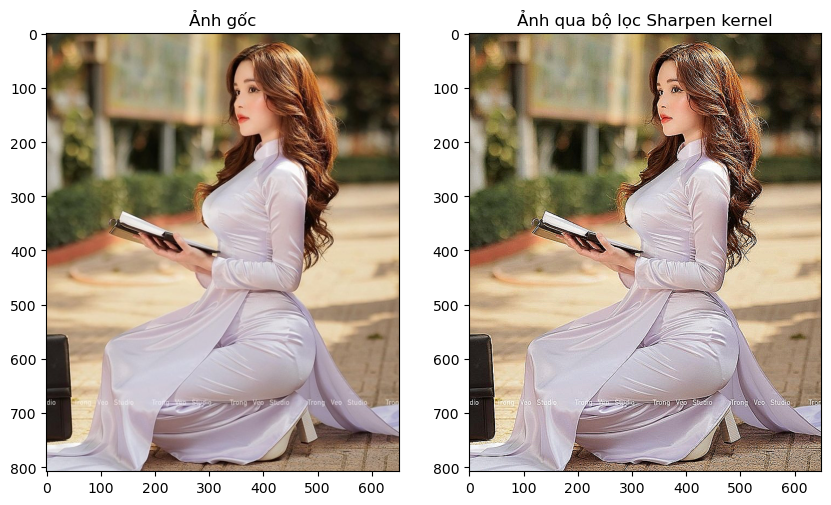

In [81]:
#Thực hiện lọc ảnh với kernel ở trên:
img_Sharpen = cv2.filter2D(img,-1,kernel_sharpen)

# Hiển thịu hình ảnh
plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
plt.imshow(img)
plt.title('Ảnh gốc')

plt.subplot(1,2,2)
plt.imshow(img_Sharpen)
plt.title('Ảnh qua bộ lọc Sharpen kernel')

plt.show()

In [83]:
#Khởi tạo kernel:
kernel_emboss = np.array([[-2,-1,0],
                         [-1,1,1],
                         [0,1,2]])

print('Bộ lọc emboss kernel:\n',kernel_emboss)



Bộ lọc emboss kernel:
 [[-2 -1  0]
 [-1  1  1]
 [ 0  1  2]]


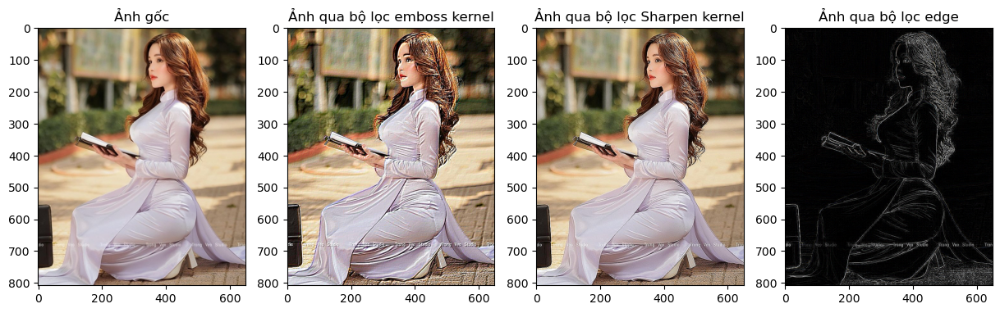

In [86]:
#Thực hiện lọc ảnh với kernel ở trên:
img_emboss = cv2.filter2D(img,-1,kernel_emboss)

# Hiển thịu hình ảnh
plt.figure(figsize=(15,6))
plt.subplot(1,4,1)
plt.imshow(img)
plt.title('Ảnh gốc')

plt.subplot(1,4,2)
plt.imshow(img_emboss)
plt.title('Ảnh qua bộ lọc emboss kernel')

plt.subplot(1,4,3)
plt.imshow(img_Sharpen)
plt.title('Ảnh qua bộ lọc Sharpen kernel')

plt.subplot(1,4,4)
plt.imshow(img_edge)
plt.title('Ảnh qua bộ lọc edge')

plt.show()

### 4. Bộ lọc làm mịn blur():
---
Tương tự với bộ lọc trung bình cv2.blur()

In [82]:
#Khởi tạo kernel:
kernel_blur = np.array([[1/9, 1/9, 1/9], 
                        [1/9, 1/9, 1/9],
                        [1/9, 1/9, 1/9]])

print(kernel_blur)

[[0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]]


## THỰC HÀNH 2.10: 
---
Yêu cầu :
* Sinh viên đọc và hiển thị ảnh images/Thuchanh2_10. ở chế độ mặc định.
* Áp dụng 4 bộ lọc khác nhau trên ảnh và hiển thị kết quả (xem chi tiết các bộ lọc trong slide bài giảng)
<img src = 'images/Thuchanh2_10.png' width='300px'>

https://setosa.io/ev/image-kernels/

In [112]:
# Đọc ảnh
img_th2_10 = cv2.imread('images/Thuchanh2_10.png',0)

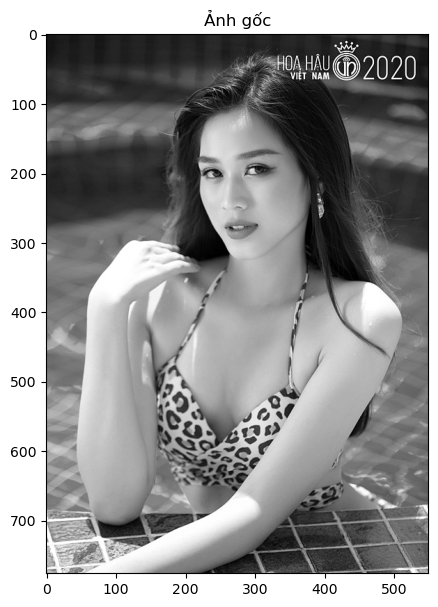

In [114]:
plt.figure(figsize=(10,7))
plt.imshow(img_th2_10,cmap='gray')
plt.title('Ảnh gốc')
plt.show()

In [101]:
#{SINH VIÊN VIẾT CODE VÀO ĐÂY}
# Bộ  lọc 1: Blur
kernel_blur = np.array([[0.0625, 0.125, 0.0625], 
                        [0.125, 0.25, 0.125],
                        [0.0625, 0.125, 0.0625]])

print(kernel_blur)

[[0.0625 0.125  0.0625]
 [0.125  0.25   0.125 ]
 [0.0625 0.125  0.0625]]


In [102]:
# Bộ lọc 2: Emboss
kernel_emboss = np.array([[-2, -1, 0], 
                        [-1, 1, 1],
                        [0, 1, 2]])

print(kernel_emboss)

[[-2 -1  0]
 [-1  1  1]
 [ 0  1  2]]


In [103]:
# Bộ lọc 3: bottom sobel
kernel_bottom_sobel = np.array([[-1, -2, 1], 
                        [0,0,0],
                        [1,2,1]])

print(kernel_bottom_sobel)

[[-1 -2  1]
 [ 0  0  0]
 [ 1  2  1]]


In [105]:
# Bộ lọc 4: edge
kernel_edge = np.array([[-1,-1,-1], 
                        [-1, 8, -1],
                        [-1,-1,-1]])

print(kernel_edge)

[[-1 -1 -1]
 [-1  8 -1]
 [-1 -1 -1]]


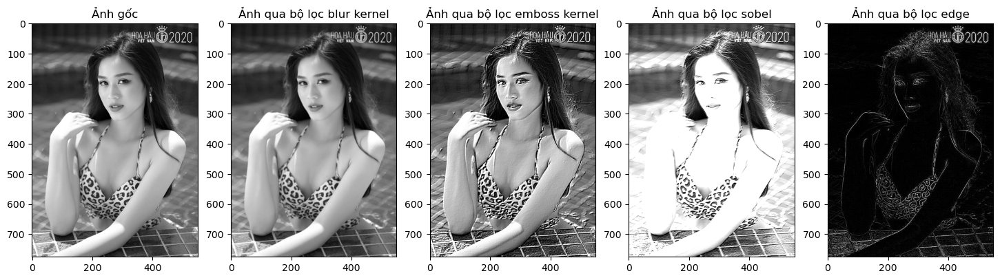

In [117]:
#Thực hiện lọc ảnh với kernel ở trên:
# Bộ lọc 1:
th2_10_blur = cv2.filter2D(img_th2_10,-1,kernel_blur)

# Bộ lọc 2: 
th2_10_emboss = cv2.filter2D(img_th2_10,-1,kernel_emboss)

# Bộ lọc 3: 
th2_10_sobel = cv2.filter2D(img_th2_10,-1,kernel_bottom_sobel)

# Bộ lọc 4:
th2_10_edge = cv2.filter2D(img_th2_10,-1,kernel_edge)

# Hiển thịu hình ảnh
plt.figure(figsize=(18,6))
plt.subplot(1,5,1)
plt.imshow(img_th2_10,cmap='gray')
plt.title('Ảnh gốc')

plt.subplot(1,5,2)
plt.imshow(th2_10_blur,cmap='gray')
plt.title('Ảnh qua bộ lọc blur kernel')

plt.subplot(1,5,3)
plt.imshow(th2_10_emboss,cmap='gray')
plt.title('Ảnh qua bộ lọc emboss kernel')

plt.subplot(1,5,4)
plt.imshow(th2_10_sobel,cmap='gray')
plt.title('Ảnh qua bộ lọc sobel')

plt.subplot(1,5,5)
plt.imshow(th2_10_edge,cmap='gray')
plt.title('Ảnh qua bộ lọc edge')

plt.show()
